In [1]:
import sys
from array import array

import matplotlib.animation
import matplotlib.artist
import matplotlib.pyplot as plt
import torch
from IPython.display import HTML, Image
from tqdm.auto import tqdm

In [2]:
print(sys.version)

3.12.9 | packaged by conda-forge | (main, Feb 14 2025, 07:56:32) [Clang 18.1.8 ]


In [3]:
f"{torch.__version__=}"

"torch.__version__='2.6.0'"

In [4]:
torch.random.manual_seed(334)

In [5]:
x = torch.arange(4)
x

tensor([0, 1, 2, 3])

In [6]:
distance_matrix_true = torch.rand((x.shape[0],) * 2)
distance_matrix_true = (distance_matrix_true + distance_matrix_true.T) / 2
distance_matrix_true.fill_diagonal_(0.0)
distance_matrix_true

tensor([[0.0000, 0.7206, 0.3038, 0.7417],
        [0.7206, 0.0000, 0.4953, 0.7764],
        [0.3038, 0.4953, 0.0000, 0.3025],
        [0.7417, 0.7764, 0.3025, 0.0000]])

In [7]:
class Embedding(torch.nn.Module):
    def __init__(self, num_embeddings: int, embedding_dim: int) -> None:
        super().__init__()
        self.embedding = torch.nn.Embedding(num_embeddings, embedding_dim)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.embedding(x)

In [8]:
def fit(
    x: torch.Tensor,
    embedding_dim: int,
    epoch: int = 100,
    lr: float = 1e-3,
    patience: int | None = None,
):
    size: int = x.shape[0]

    arr_losses = array("f")
    list_x_embedded: list[torch.Tensor] = list()

    model = Embedding(x.max().item() + 1, embedding_dim)
    optimizer = torch.optim.SGD(model.parameters(), lr=lr)
    optimizer.zero_grad()
    for i_epoch in tqdm(range(epoch)):
        x_embedded: torch.Tensor = model(x)
        distance_matrix_embedded = torch.cdist(*(x_embedded,) * 2)

        loss = (
            distance_matrix_embedded - distance_matrix_true
        ).abs().sum() / (size * (size - 1) / (2 * 1))

        loss.backward()
        optimizer.step()

        arr_losses.append(loss.item())
        list_x_embedded.append(x_embedded.detach())

        if (
            patience
            and i_epoch + 1 >= patience
            and min(arr_losses[-patience:]) == arr_losses[-patience]
        ):
            break
    return (arr_losses, list_x_embedded)


In [9]:
epoch = 5000
embedding_dim = 2
arr_losses, list_x_embedded = fit(
    x,
    embedding_dim=embedding_dim,
    epoch=epoch,
    lr=1e-3,
    # patience=2,
)


  0%|          | 0/5000 [00:00<?, ?it/s]

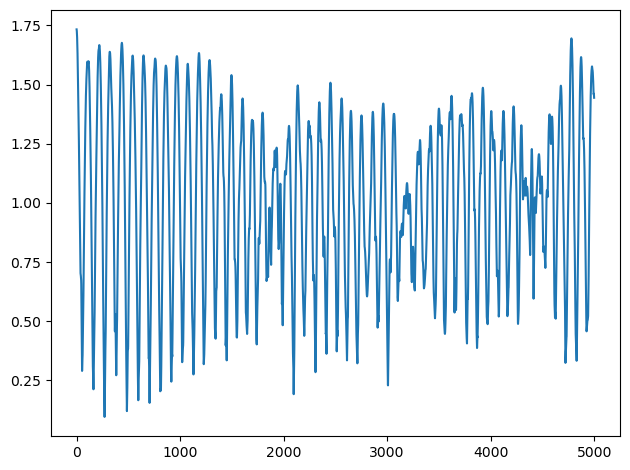

In [10]:
fig, ax = plt.subplots()
ax.plot(arr_losses)
fig.tight_layout()

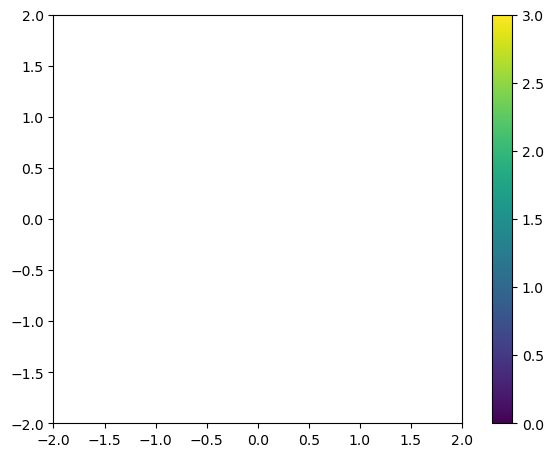

In [11]:
fig, ax = plt.subplots()

use_epochs = set(i_epoch for i_epoch in range(0, len(list_x_embedded), 10)) | {
    len(list_x_embedded)
}

artists: list[list[matplotlib.artist.Artist]] = list()
for i_epoch, x_embedded in enumerate(list_x_embedded):
    if i_epoch not in use_epochs:
        continue

    artists.append(
        [
            mappable := ax.scatter(
                *x_embedded.T, c=tuple(range(x_embedded.shape[0]))
            ),
            ax.text(
                0.5,
                1.01,
                f"epoch: {i_epoch}",
                va="bottom",
                ha="center",
                transform=ax.transAxes,
            ),
        ]
    )
ax.set_aspect("equal")
ax.set_xlim(-2, 2)
ax.set_ylim(-2, 2)
fig.colorbar(mappable)
fig.tight_layout()

ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=100)
HTML(ani.to_jshtml())

なぜ振動するのでしょう？

In [12]:
filename_gif = "embedding-optimization.gif"
ani.save(filename_gif, writer="ffmpeg")

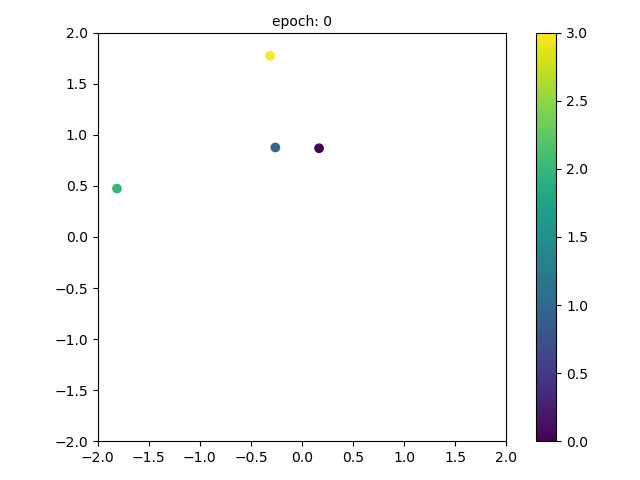

In [13]:
Image(filename=filename_gif)